# SWOT along-track SSH spectra analysis

SSHA spectra computed in **Global_SSH_spectra_dask_computation.ipynb** are analysed in this notebook. Maps of number of segments available as well as integrated spectra are shown. Zonal and meridional averages are also plotted.

In [1]:
%matplotlib inline
%config InlineBackend.print_figure_kwargs = {'bbox_inches': None}

In [2]:
import glob
import os
import warnings
from collections import defaultdict
from pathlib import Path

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patheffects as pe


from swot_analysis import compute_pass_spectra
from swot_analysis import load_swot_l2_expert 

## 1. Configuration


In [3]:
# ── Input files ───────────────────────────────────────────────────────────────
DATA_DIR    = '/work/uo0122/u241387/SWOT_SSH/'
DATA_SUBDIR = 'diags_2024/'


# ── Region of interest ────────────────────────────────────────────────────────
LAT_MIN, LAT_MAX = -60.0,60.0
LON_MIN, LON_MAX = 0.0,360.0

# ── File parameters ───────────────────────────────────────────────────────
SEGMENT_LENGTH_KM = 250.0
BOX_DEG = 2.0
filename_pattern = f'swot_unsmoothed_aliased_{int(SEGMENT_LENGTH_KM)}km_full.nc'
#filename_pattern = '202401.nc'

# ── Expert-product variable names ─────────────────────────────────────────────
SSH_VAR = 'ssha_karin_2'
HRET    = False   # add internal tide correction (height_cor_xover + internal_tide_hret)

## 3. Defining functions

In [4]:
def build_box_dataset(ds_segments: xr.Dataset,
                      box_deg: float = 2.0,
                      min_sampling_seg: int = 5) -> xr.Dataset:

    from collections import defaultdict

    lat     = ds_segments['lat_mean'].values
    lon     = ds_segments['lon_mean'].values
    lat_idx = np.floor(lat / box_deg).astype(int)
    lon_idx = np.floor(lon / box_deg).astype(int)

    box_to_segs = defaultdict(list)
    for i, key in enumerate(zip(lat_idx, lon_idx)):
        box_to_segs[key].append(i)

    direct_all = ds_segments['direct_psd'].values
    native_all = ds_segments['native_psd'].values
    wavenumber = ds_segments['wavenumber'].values
    rows_lat, rows_lon, rows_n = [], [], []
    rows_direct, rows_aliased, rows_total = [], [], []

    for (li, loi), idxs in sorted(box_to_segs.items()):
        rows_direct.append(np.nanmean(direct_all[idxs, :], axis=0))
        rows_total.append(np.nanmean(native_all[idxs, :], axis=0))
        rows_n.append(len(idxs))
        rows_lat.append((li  + 0.5) * box_deg)
        rows_lon.append((loi + 0.5) * box_deg)

    n_segments = np.array(rows_n)
    n_max      = n_segments.max()
    keep       = n_segments >= min_sampling_seg # * n_max

    direct_stack  = np.stack(rows_direct, axis=0)
    total_stack  = np.stack(rows_total, axis=0)
    lat_center = np.array(rows_lat)
    lon_center = np.array(rows_lon)

    return xr.Dataset(
        data_vars=dict(
            direct_mean_psd=(['box', 'wavenumber'], direct_stack[keep],
                      {'long_name': 'Box-mean SSH(A) direct PSD', 'units': 'm^2 / (cycles/km)'}),
            native_mean_psd=(['box', 'wavenumber'], total_stack[keep],
                      {'long_name': 'Box-mean SSH(A) total PSD', 'units': 'm^2 / (cycles/km)'}),
            n_segments=(['box'], n_segments[keep]),
            sampling_fraction=(['box'], n_segments[keep] / n_max),
            lat_center=(['box'], lat_center[keep], {'units': 'degrees_north'}),
            lon_center=(['box'], lon_center[keep], {'units': 'degrees_east'}),
        ),
        coords=dict(
            wavenumber=('wavenumber', wavenumber, {'units': 'cycles/km'}),
            box=('box', np.arange(keep.sum())),
        ),
        attrs=dict(box_size_deg=box_deg,
                   min_sampling_fraction=min_sampling_seg),
    )

## 4. Loading files
read files and assigns boxes to segments using `build_boxes` if necessary.

In [5]:
ds_segments = xr.open_dataset(DATA_DIR+DATA_SUBDIR+filename_pattern)
print(f'Segment dataset: {ds_segments.sizes}')

Segment dataset: Frozen({'segment': 148965, 'wavenumber': 500})


In [15]:
recs_01   = ds_segments.sel(wavenumber=0.1,method='nearest')
ds_flagged   = ds_segments.where(recs_01.direct_psd<=1e-3)

In [16]:
ds_boxes = build_box_dataset(ds_segments, box_deg=BOX_DEG,min_sampling_seg=1)
ds_boxes_flagged = build_box_dataset(ds_flagged, box_deg=BOX_DEG,min_sampling_seg=1)

/tmp/ipykernel_323282/695261119.py:9: RuntimeWarning: invalid value encountered in cast
  lat_idx = np.floor(lat / box_deg).astype(int)
/tmp/ipykernel_323282/695261119.py:10: RuntimeWarning: invalid value encountered in cast
  lon_idx = np.floor(lon / box_deg).astype(int)
/tmp/ipykernel_323282/695261119.py:23: RuntimeWarning: Mean of empty slice
  rows_direct.append(np.nanmean(direct_all[idxs, :], axis=0))
/tmp/ipykernel_323282/695261119.py:24: RuntimeWarning: Mean of empty slice
  rows_total.append(np.nanmean(native_all[idxs, :], axis=0))


In [17]:
print('Segments per swath:')
for sw in ('left', 'right'):
    
    n = int((ds_segments['swath'] == sw).sum())
    print(f'  {sw}: {n}')

#unique_granules = len(np.unique(ds_segments['granule'].values))
#print(f'Unique granules contributing segments: {unique_granules}')
print(f'Boxes with ≥  5 segments: {int((ds_boxes["n_segments"] >=  5).sum())}')
print(f'Boxes with ≥ 10 segments: {int((ds_boxes["n_segments"] >= 10).sum())}')
print(f'Max segments in a box:    {int(ds_boxes["n_segments"].max())}')
print(f'Min segments in a box:    {int(ds_boxes["n_segments"].min())}')


print('Segments per swath (flagged):')
for sw in ('left', 'right'):
    
    n = int((ds_flagged['swath'] == sw).sum())
    print(f'  {sw}: {n}')

#unique_granules = len(np.unique(ds_segments['granule'].values))
#print(f'Unique granules contributing segments: {unique_granules}')
print(f'Boxes with ≥  5 segments: {int((ds_boxes_flagged["n_segments"] >=  5).sum())}')
print(f'Boxes with ≥ 10 segments: {int((ds_boxes_flagged["n_segments"] >= 10).sum())}')
print(f'Max segments in a box:    {int(ds_boxes_flagged["n_segments"].max())}')
print(f'Min segments in a box:    {int(ds_boxes_flagged["n_segments"].min())}')

Segments per swath:
  left: 74542
  right: 74423
Boxes with ≥  5 segments: 8799
Boxes with ≥ 10 segments: 8360
Max segments in a box:    54
Min segments in a box:    1
Segments per swath (flagged):
  left: 66780
  right: 67973
Boxes with ≥  5 segments: 8551
Boxes with ≥ 10 segments: 7836
Max segments in a box:    14212
Min segments in a box:    1


In [64]:
def hamming_transfer_function(
    wavenumber: np.ndarray,
    dx_km: float,
    n_taps: int = 9,
):
    """
    Frequency response of a centered Hamming moving-average filter.

    Replace this function if your exact Expert filtering kernel is known
    and differs from this definition.
    """

    n_taps = int(n_taps)

    if n_taps < 1:
        return np.ones_like(wavenumber)

    if n_taps == 1:
        return np.ones_like(wavenumber)

    window = np.hamming(n_taps)
    window = window / window.sum()

    # FIR frequency response.
    omega = 2.0 * np.pi * wavenumber * dx_km

    n = np.arange(n_taps)

    H = np.sum(
        window[None, :]
        * np.exp(-1j * omega[:, None] * n[None, :]),
        axis=1,
    )

    return np.abs(H) ** 2

In [71]:
N_TAPS = 17
k      = ds_segments.wavenumber.values
H      = hamming_transfer_function(k, dx_km = 0.25, n_taps=N_TAPS)
k_half = k[np.argmin(np.abs(H - 0.5))]

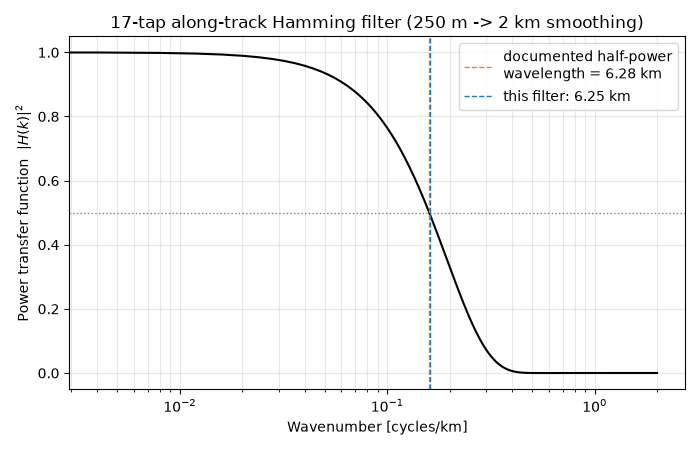

In [72]:
fig, ax = plt.subplots(figsize=(7, 4.5))
ax.plot(k, H, c='k', lw=1.5)
ax.axhline(0.5, c='0.5', ls=':', lw=1)
ax.axvline(1 / 6.28, c='C1', ls='--', lw=1, label='documented half-power\nwavelength = 6.28 km')
ax.axvline(k_half, c='C0', ls='--', lw=1, label=f'this filter: {1/k_half:.2f} km')
ax.set_xscale('log')
ax.set_xlabel('Wavenumber [cycles/km]')
ax.set_ylabel(r'Power transfer function  $|H(k)|^2$')
ax.set_title(f'{N_TAPS}-tap along-track Hamming filter (250 m -> 2 km smoothing)')
ax.grid(True, which='both', alpha=0.3)
ax.legend()
fig.tight_layout()

## 5. Diagnostics

In [27]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
import cartopy
import cmocean
cartopy.config['data_dir'] = '/work/uo0122/u241387/cartopy_data'

def plot_box(var : np.array, lon : np.array, lat : np.array,
             projection : ccrs = ccrs.Robinson(), cmap : str="viridis", 
             min_size : int=20, max_size : int=300, figsize : tuple=(14, 7), s: int=45,
             fig=None, ax=None,
             #title : str = "Number of observations per box",
             label : str = "Number of observations",
            vmin : float = None, vmax : float = None, norm=None
            ):

    mask = np.isfinite(var)
    lon = lon[mask]
    lat = lat[mask]
    var = var[mask]
    if ax is None:
        fig = plt.figure(figsize=figsize)
        ax = plt.axes(projection=projection)
    ax.set_global()
    ax.add_feature(cfeature.LAND,facecolor="0.9",edgecolor="none")
    ax.add_feature(cfeature.COASTLINE,linewidth=0.6)
    ax.add_feature(cfeature.BORDERS,linewidth=0.3)
    gl = ax.gridlines(draw_labels=True,linewidth=0.3,linestyle="--",alpha=0.5)
    
    gl.top_labels = False
    gl.right_labels = False

    gl.xlocator = mticker.FixedLocator(np.arange(-180, 181, 60))
    gl.ylocator = mticker.FixedLocator(np.arange(-60, 61, 30))

    gl.xlabel_style = {"size": 10,"color": "black",}

    gl.ylabel_style = {"size": 10,"color": "black",}
    
    if norm is not None:
        sc = ax.scatter(lon,lat,s=s,c=var,
                    cmap=cmap,edgecolors=None,linewidths=0.25,
                    transform=ccrs.PlateCarree(),norm = norm)
    else:
        if vmin is None:
            vmin,vmax=np.nanmin(var),np.nanmax(var)
            
        sc = ax.scatter(lon,lat,s=s,c=var,
                        cmap=cmap,edgecolors=None,linewidths=0.25,
                        transform=ccrs.PlateCarree(),vmin = vmin, vmax = vmax)


    cax = fig.add_axes([0.25, 0.08, 0.5, 0.03])  # [left, bottom, width, height], figure-relative
    cb = fig.colorbar(sc, cax=cax, orientation='horizontal')
    cb.set_label(label)  
    
    return fig, ax

### General statistics

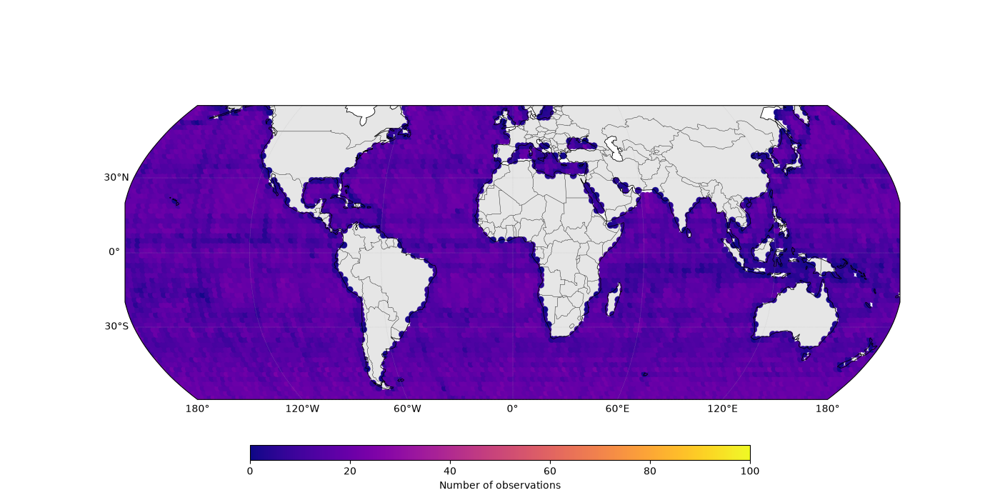

In [21]:

fig, ax = plot_box(ds_boxes_flagged["n_segments"].values,
                   ds_boxes_flagged["lon_center"].values,
                   ds_boxes_flagged["lat_center"].values,
                   #projection=ccrs.EqualEarth(),
                   cmap="plasma",vmax=100, vmin=0)
ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
plt.show()


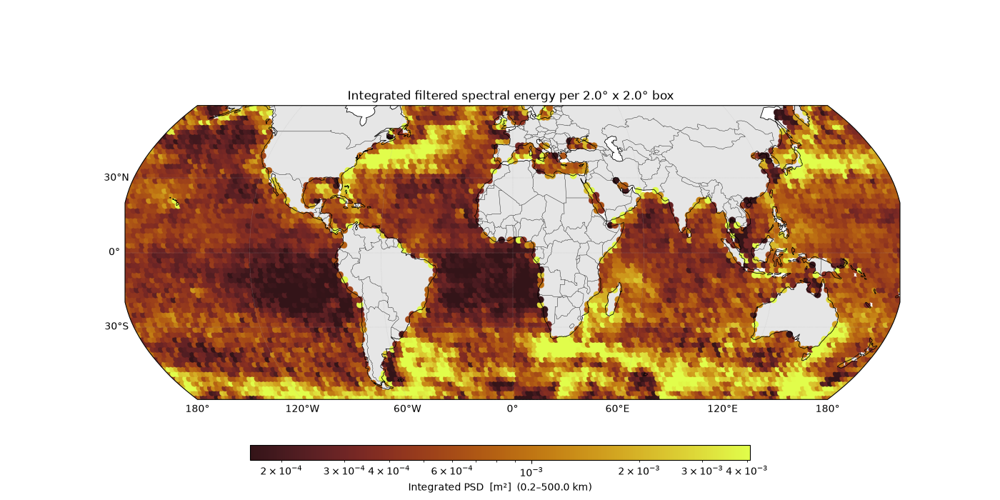

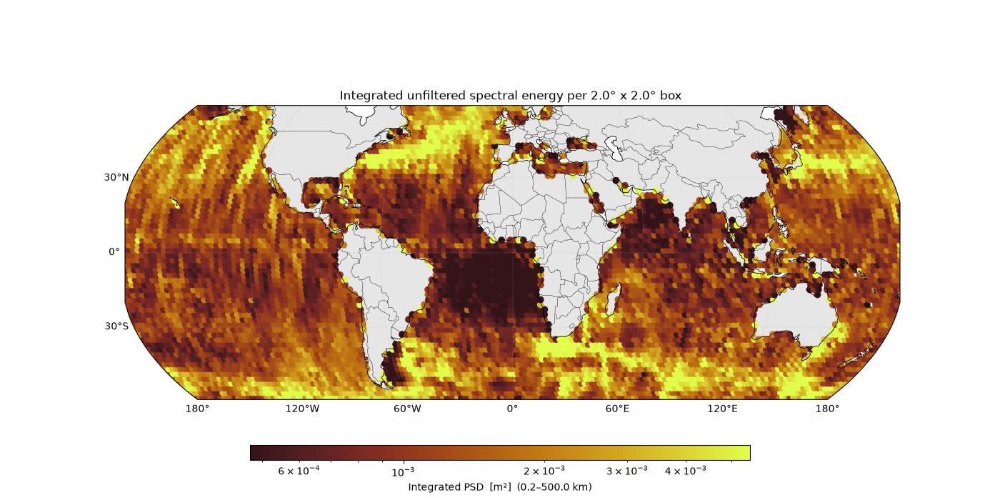

In [44]:
K_MIN, K_MAX = 1/500, 4

k      = ds_boxes['wavenumber'].values
k_mask = (k >= K_MIN) & (k <= K_MAX)
dk     = np.gradient(k)
energy = np.nansum(ds_boxes_flagged['direct_mean_psd'].values[:, k_mask] * dk[k_mask], axis=1)

fig, ax = plot_box(energy,ds_boxes_flagged["lon_center"].values,ds_boxes_flagged["lat_center"].values,
                   cmap=cmocean.cm.solar,
                   label=f'Integrated PSD  [m²]  ({1/K_MAX:.1f}–{1/K_MIN:.1f} km)',
                  norm=mcolors.LogNorm(vmin=np.nanpercentile(energy, 5),
                                       vmax=np.nanpercentile(energy, 95)))
ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
ax.set_title(f"Integrated filtered spectral energy per {BOX_DEG:.1f}° x {BOX_DEG:.1f}° box ", y=1)
plt.show()

energy = np.nansum(ds_boxes_flagged['native_mean_psd'].values[:, k_mask] * dk[k_mask], axis=1)

fig, ax = plot_box(energy,ds_boxes_flagged["lon_center"].values,ds_boxes_flagged["lat_center"].values,
                   cmap=cmocean.cm.solar,
                   label=f'Integrated PSD  [m²]  ({1/K_MAX:.1f}–{1/K_MIN:.1f} km)',
                  norm=mcolors.LogNorm(vmin=np.nanpercentile(energy, 5),
                                       vmax=np.nanpercentile(energy, 95)))
ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
ax.set_title(f"Integrated unfiltered spectral energy per {BOX_DEG:.1f}° x {BOX_DEG:.1f}° box ", y=1)
plt.show()

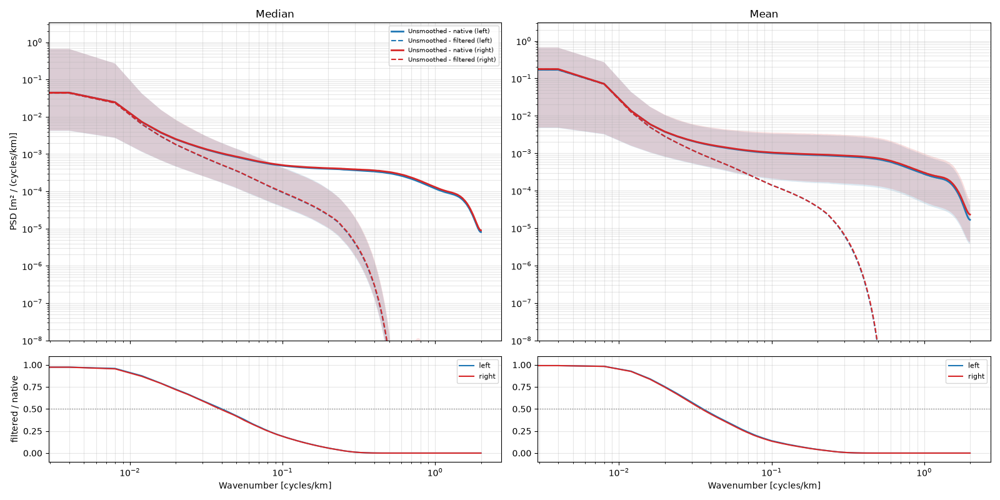

In [56]:
fig, axs = plt.subplots(2, 2, figsize=(16, 8), sharex=True,
                         gridspec_kw=dict(height_ratios=[3, 1]))

colors = {'left': 'C0', 'right': 'C3'}

for swath, c in colors.items():
    #recs_un = ds_segments_un.where(ds_segments_un.swath==swath,drop=True)
    #recs_ex = ds_segments_ex.where(ds_segments_ex.swath==swath,drop=True)
    
    k = ds_flagged['wavenumber'].values
    direct_stack = ds_flagged['direct_psd'].where(ds_flagged.swath==swath,drop=True).values
    native_stack = ds_flagged['native_psd'].where(ds_flagged.swath==swath,drop=True).values
    
    direct_median = np.nanmedian(direct_stack, axis=0)
    direct_lo, direct_hi = np.nanpercentile(direct_stack, [5, 95], axis=0)
    native_median = np.nanmedian(native_stack, axis=0)
    native_lo, native_hi = np.nanpercentile(native_stack, [5, 95], axis=0)
    native_mean = np.nanmean(native_stack, axis=0)
    direct_mean = np.nanmean(direct_stack, axis=0)
    
    ax = axs[0,0]
    ax.fill_between(k, direct_lo, direct_hi, color=c, alpha=0.15, lw=0)
    ax.loglog(k, native_median, c=c, lw=2, label=f'Unsmoothed - native ({swath})')
    ax.loglog(k, direct_median, c=c, lw=1.5, ls='--', label=f'Unsmoothed - filtered ({swath})')
    
    ax = axs[0,1]
    ax.fill_between(k, native_lo, native_hi, color=c, alpha=0.15, lw=0)
    ax.loglog(k, native_mean, c=c, lw=2, ls='-', label=f'Unsmoothed - native ({swath})')
    ax.loglog(k, direct_mean, c=c, lw=1.5, ls='--', label=f'Unsmoothed - filtered ({swath})')
    
    axs[1,0].semilogx(k, direct_median / native_median, c=c, lw=1.5, label=swath)
    axs[1,1].semilogx(k, direct_mean / native_mean, c=c, lw=1.5, label=swath)

axs[0,0].set_ylabel('PSD [m² / (cycles/km)]')
#axs[0].set_title(f'Patch-matched validation ({sum(len(v) for v in patch_match_results.values())} '
#                  f'matched patches, this file)')
axs[0,0].grid(True, which='both', alpha=0.3)
axs[0,1].grid(True, which='both', alpha=0.3)
axs[0,0].legend(fontsize=7)
axs[0,0].set_ylim(1e-8,None) ; axs[0,1].set_ylim(1e-8,None)

axs[1,0].set_ylabel('filtered / native')
for ax in axs[1,:]:
    ax.axhline(0.5, c='0.5', ls=':', lw=1)
    ax.set_xlabel('Wavenumber [cycles/km]')
    ax.grid(True, which='both', alpha=0.3)
    ax.legend(fontsize=8)
    ax.set_ylim(-0.1
                ,1.1)

axs[0,0].set_title('Median')
axs[0,1].set_title('Mean')
fig.tight_layout()

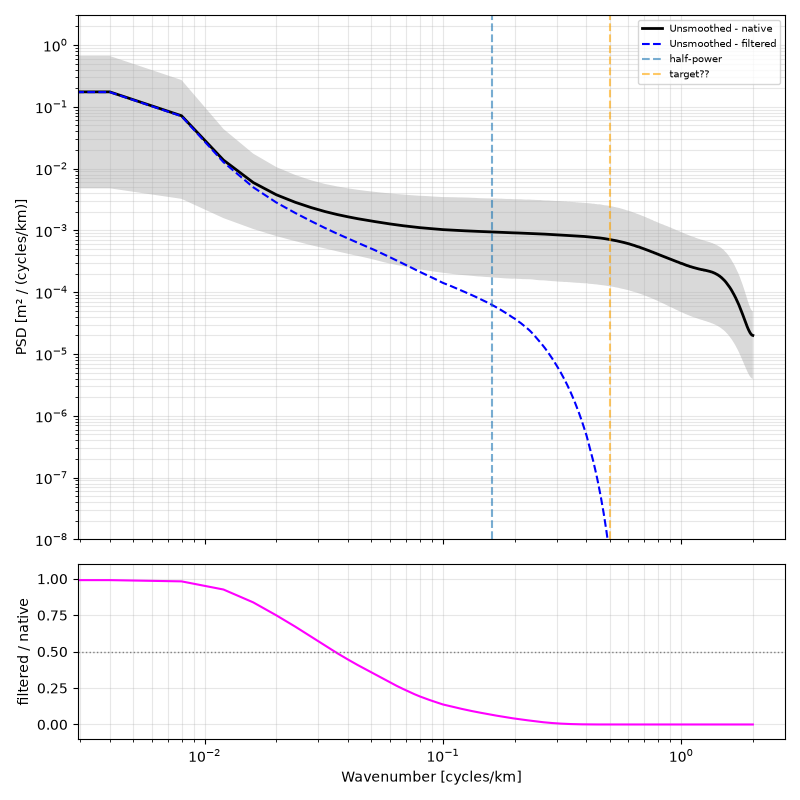

In [81]:
fig, axs = plt.subplots(2,1, figsize=(8, 8), sharex=True, gridspec_kw=dict(height_ratios=[3, 1]))

    
k = ds_flagged['wavenumber'].values
direct_stack = ds_flagged['direct_psd'].values
native_stack = ds_flagged['native_psd'].values

native_mean = np.nanmean(native_stack, axis=0)
direct_mean = np.nanmean(direct_stack, axis=0)
native_lo, native_hi = np.nanpercentile(native_stack, [5, 95], axis=0)

ax = axs[0]
ax.fill_between(k, native_lo, native_hi, color='k', alpha=0.15, lw=0)
ax.loglog(k, native_mean, c='k', lw=2, ls='-', label=f'Unsmoothed - native')
ax.loglog(k, direct_mean, c='b', lw=1.5, ls='--', label=f'Unsmoothed - filtered')
ax.axvline(k_half,ls='--',alpha = 0.6, label='half-power')
ax.axvline(1/2,ls='--',c = 'orange',alpha = 0.6, label='target??')


axs[1].semilogx(k, direct_mean / native_mean, c='magenta', lw=1.5)

axs[0].set_ylabel('PSD [m² / (cycles/km)]')
#axs[0].set_title(f'Patch-matched validation ({sum(len(v) for v in patch_match_results.values())} '
#                  f'matched patches, this file)')
axs[0].grid(True, which='both', alpha=0.3)
axs[0].legend(fontsize=7)
axs[0].set_ylim(1e-8,None)

axs[1].set_ylabel('filtered / native')
axs[1].axhline(0.5, c='0.5', ls=':', lw=1)
axs[1].set_xlabel('Wavenumber [cycles/km]')
axs[1].grid(True, which='both', alpha=0.3)
axs[1].set_ylim(-0.1,1.1)
fig.tight_layout()

### Global maps: integrated PSD and spectral slopes

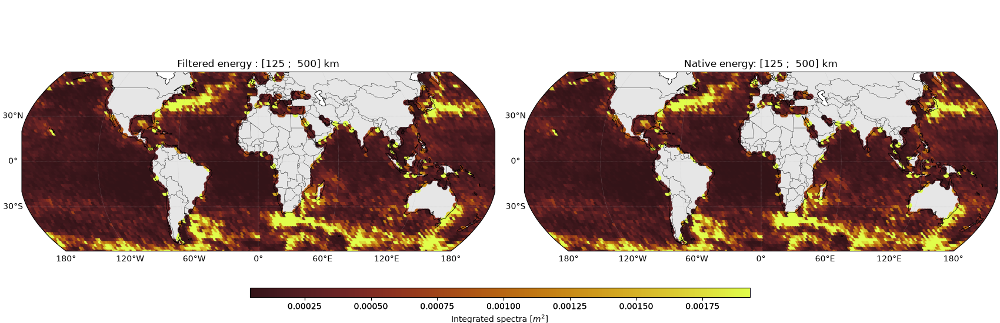

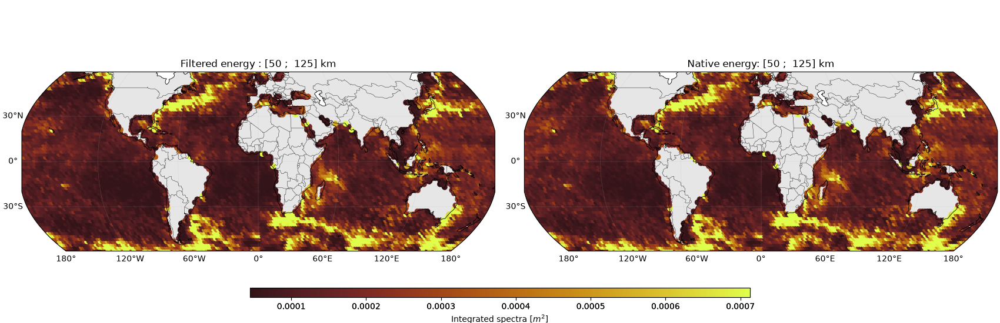

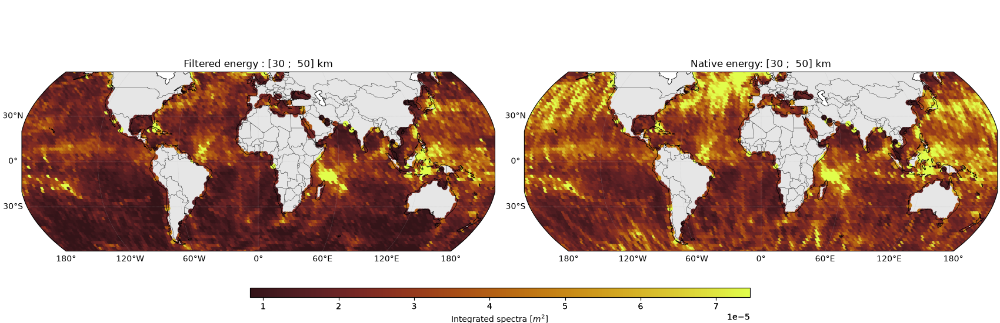

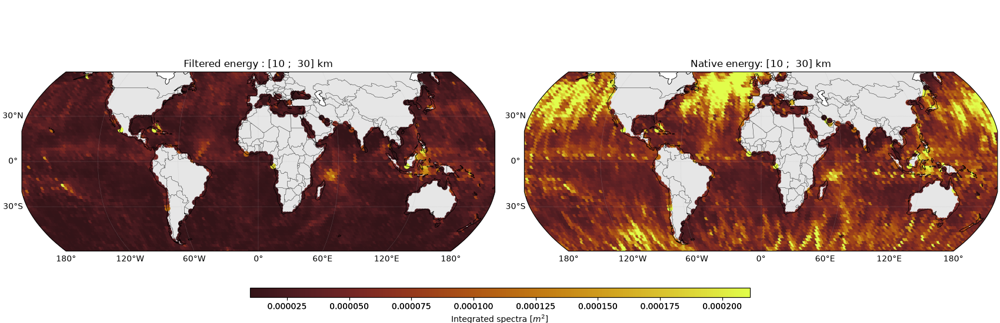

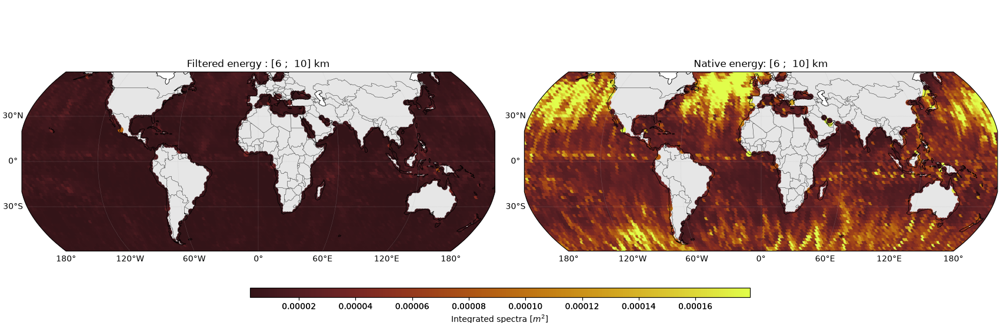

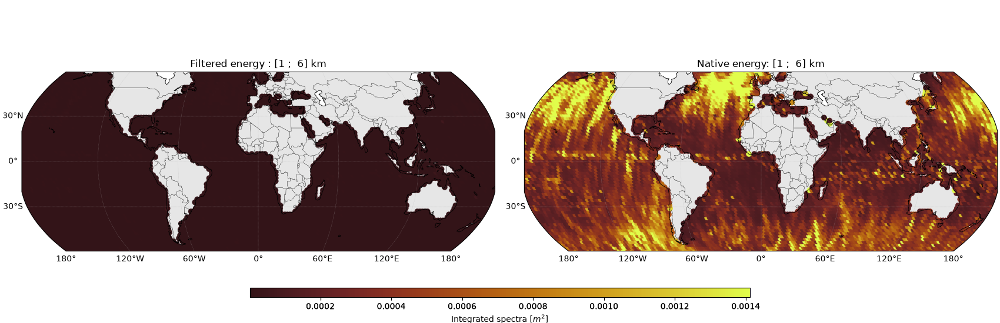

In [125]:
# Integrate the mean PSD over different wavenumber bands
K_MIN, K_MAX = [1/500,1/125,1/50,1/30,1/10,1/6], [1/125,1/50,1/30,1/10,1/6,1] # /km

for kmin,kmax in zip(K_MIN, K_MAX):
    energy_alias = ds_boxes_flagged["native_mean_psd"].sel(wavenumber=slice(kmin, kmax)).integrate('wavenumber').values
    energy = ds_boxes_flagged["direct_mean_psd"].sel(wavenumber=slice(kmin, kmax)).integrate('wavenumber').values
    
    figs, axs = plt.subplots(1, 2,figsize=(17, 5.5),
    subplot_kw={"projection": ccrs.Robinson()},constrained_layout=True)
    fig, ax = plot_box(energy,
                       ds_boxes_flagged["lon_center"].values,
                       ds_boxes_flagged["lat_center"].values,
                       label=r'Integrated spectra [$m^2$]',
                       cmap=cmocean.cm.solar,
                      vmin = min(np.nanpercentile(energy,5),np.nanpercentile(energy_alias,5)),vmax=max(np.nanpercentile(energy,95),np.nanpercentile(energy_alias,95)),
                      fig=figs,ax=axs[0])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
    axs[0].set_title(f'Filtered energy : [{1/kmax:.0f} ; {1/kmin: .0f}] km',y=1.0)
    fig, ax = plot_box(energy_alias,
                       ds_boxes_flagged["lon_center"].values,
                       ds_boxes_flagged["lat_center"].values,
                       label='',
                       cmap=cmocean.cm.solar,
                      vmin = min(np.nanpercentile(energy,5),np.nanpercentile(energy_alias,5)),vmax=max(np.nanpercentile(energy,95),np.nanpercentile(energy_alias,95)),
                      fig=figs,ax=axs[1])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
    axs[1].set_title(f'Native energy: [{1/kmax:.0f} ; {1/kmin: .0f}] km',y=1.0)
    #figs.tight_layout()
    #fig.suptitle(f"Aliased energy: [{1/kmax:.0f} ; {1/kmin:.0f}] km")
    plt.show()

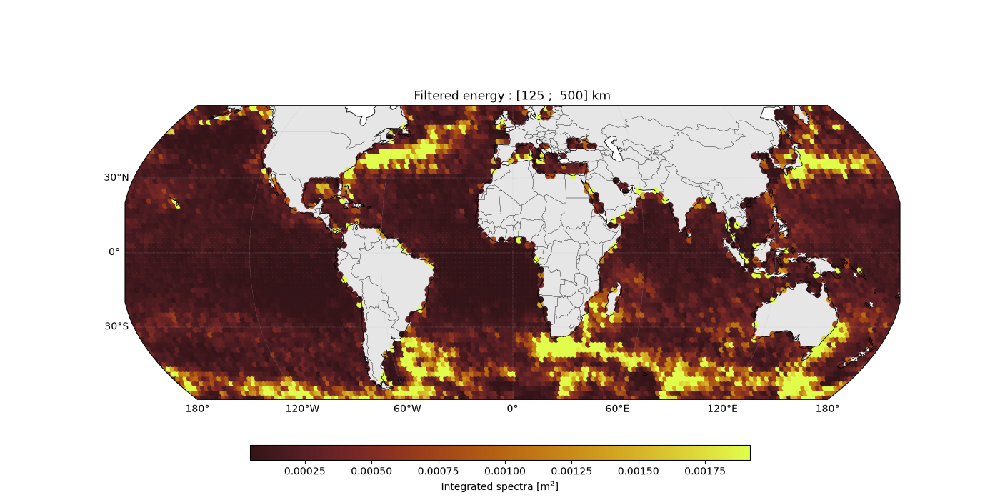

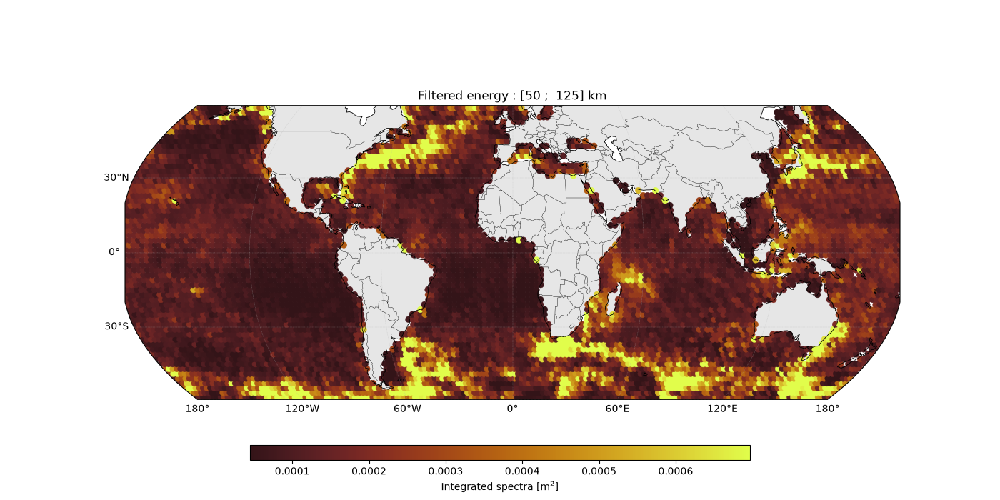

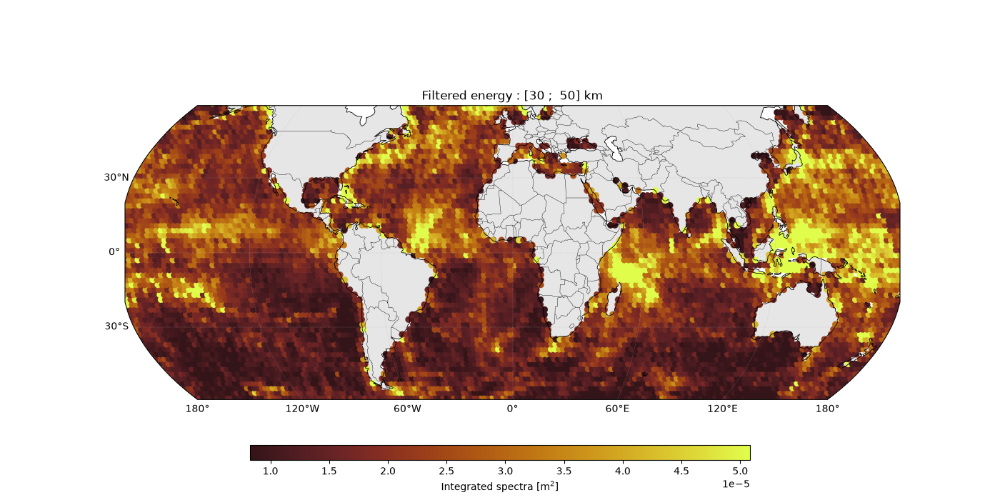

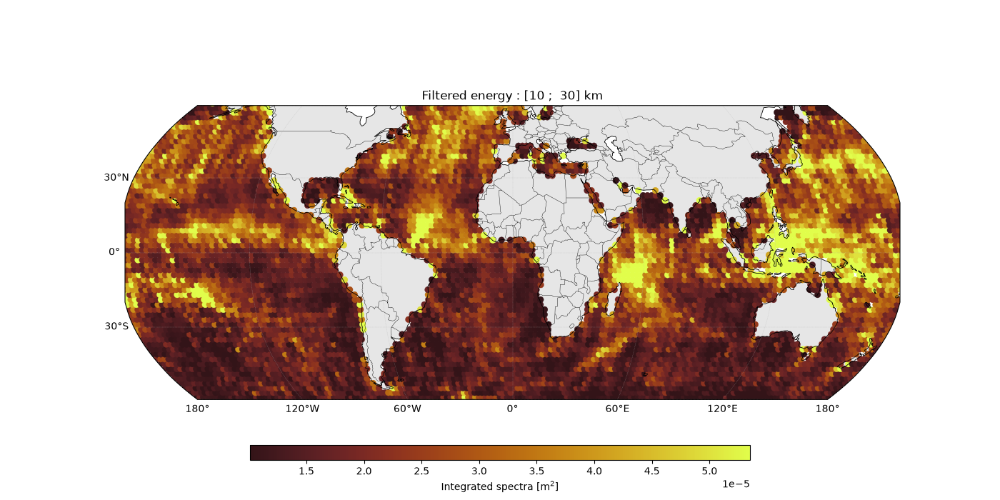

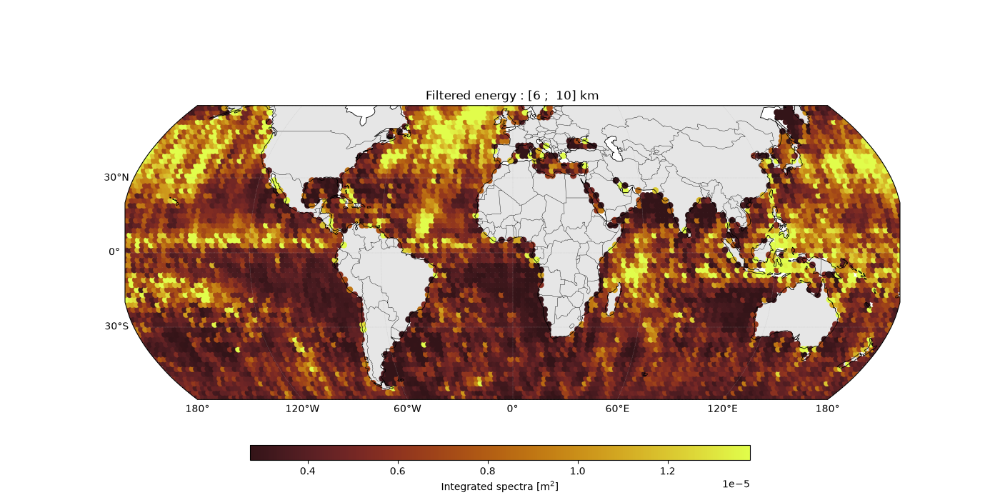

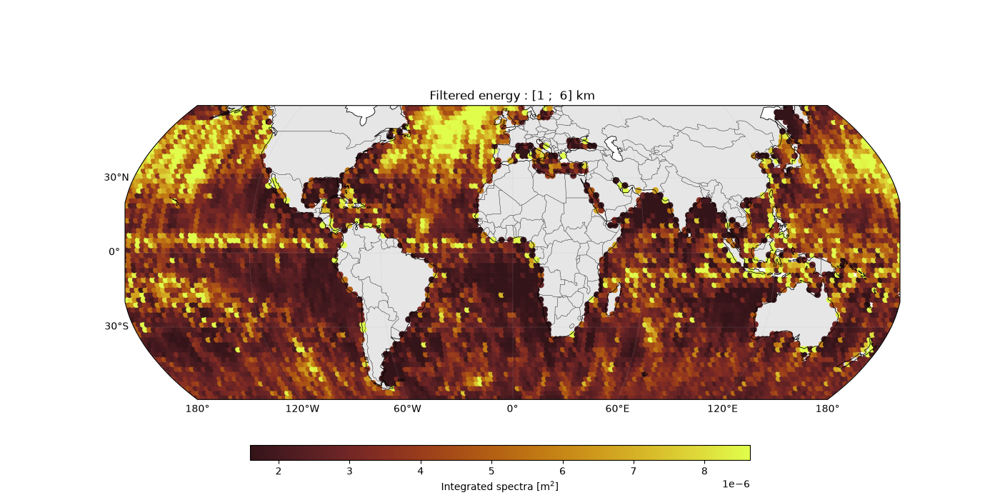

In [32]:
for kmin,kmax in zip(K_MIN, K_MAX):
    energy = ds_boxes_flagged["direct_mean_psd"].sel(wavenumber=slice(kmin, kmax)).integrate('wavenumber').values
    fig, ax = plot_box(energy,
                       ds_boxes_flagged["lon_center"].values,
                       ds_boxes_flagged["lat_center"].values,
                       label=r'Integrated spectra [m$^2$]',
                       cmap=cmocean.cm.solar,
                      vmin = np.nanpercentile(energy,5),vmax = np.nanpercentile(energy,95),
                       s = 40,
                      )
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
    ax.set_title(f'Filtered energy : [{1/kmax:.0f} ; {1/kmin: .0f}] km',y=1.0)
    #figs.tight_layout()
    #fig.suptitle(f"Aliased energy: [{1/kmax:.0f} ; {1/kmin:.0f}] km")
    plt.show()

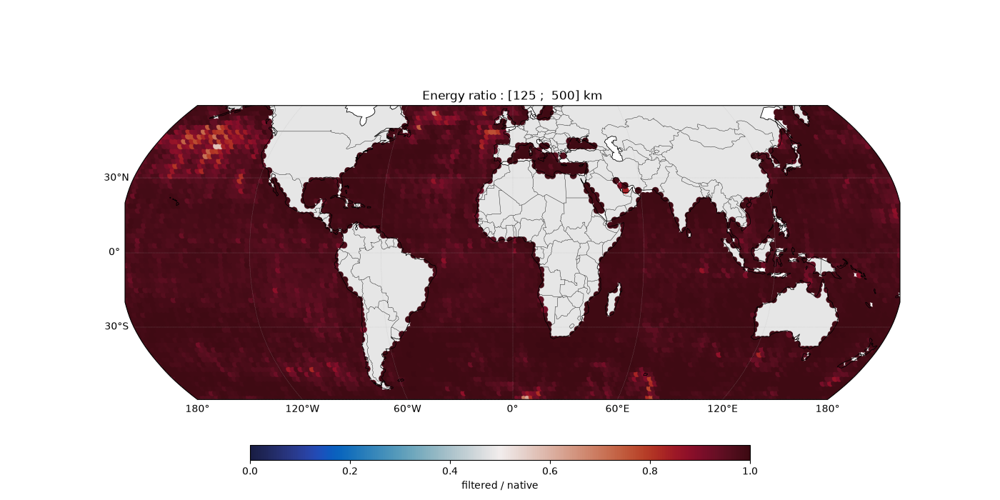

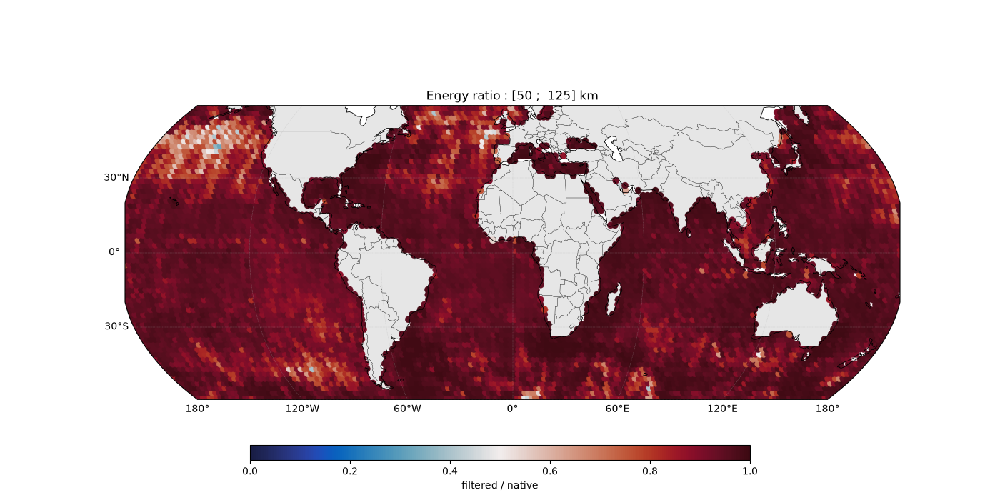

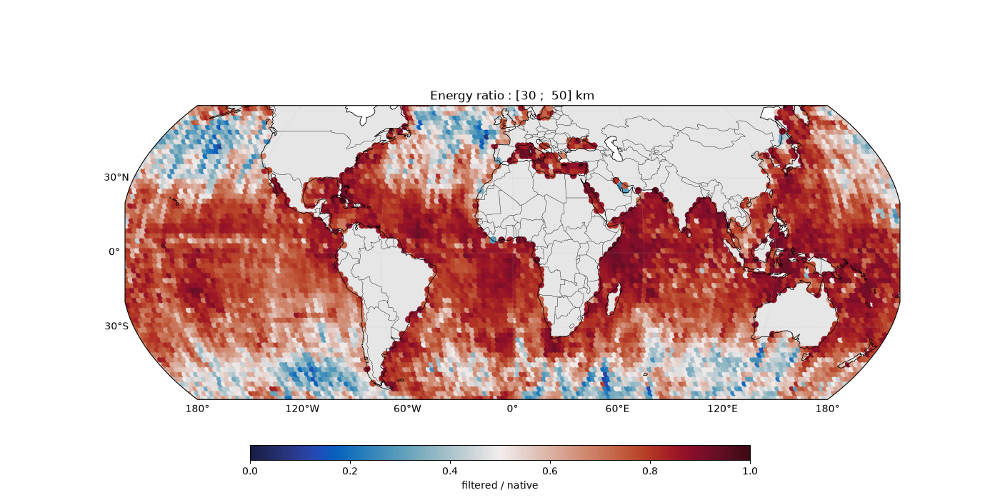

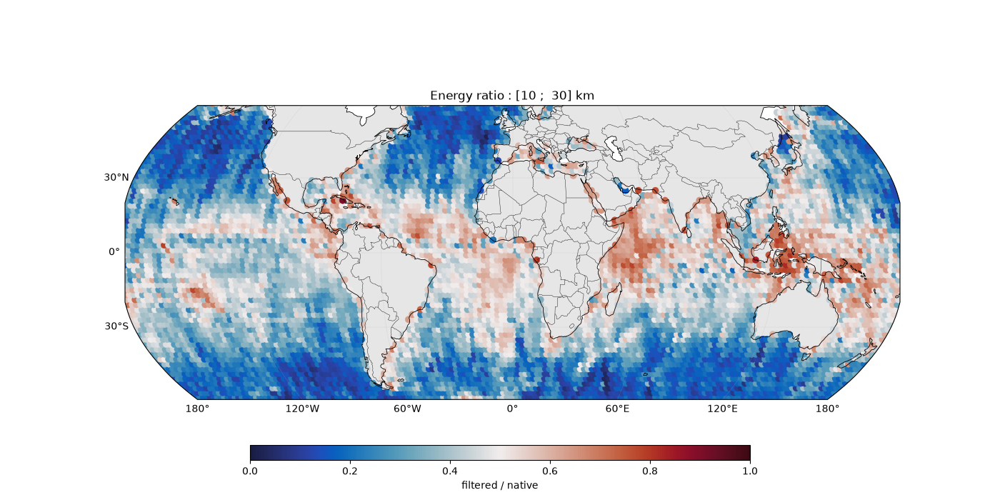

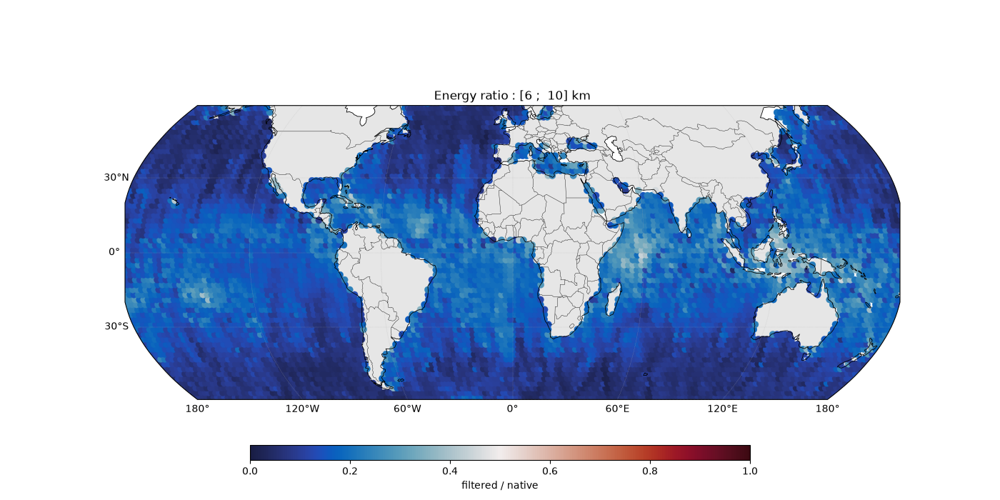

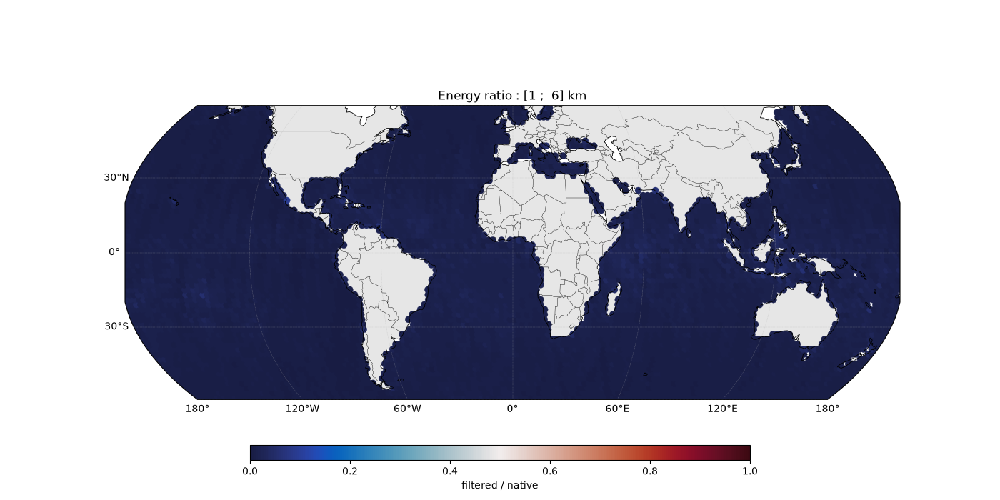

In [128]:
for kmin,kmax in zip(K_MIN, K_MAX):
    energy_native = ds_boxes_flagged["native_mean_psd"].sel(wavenumber=slice(kmin, kmax)).integrate('wavenumber').values
    energy = ds_boxes_flagged["direct_mean_psd"].sel(wavenumber=slice(kmin, kmax)).integrate('wavenumber').values
    ratio = energy / energy_native
    fig, ax = plot_box(ratio,
                       ds_boxes_flagged["lon_center"].values,
                       ds_boxes_flagged["lat_center"].values,
                       label=r'filtered / native',
                       cmap=cmocean.cm.balance,
                      vmin = 0,vmax=1,
                      )
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
    ax.set_title(f'Energy ratio : [{1/kmax:.0f} ; {1/kmin: .0f}] km',y=1.0)
    #figs.tight_layout()
    #fig.suptitle(f"Aliased energy: [{1/kmax:.0f} ; {1/kmin:.0f}] km")
    plt.show()

/tmp/ipykernel_323282/2506858527.py:8: RuntimeWarning: divide by zero encountered in log10
  k_vals = np.log10(ds_boxes_flagged["wavenumber"].values)          # (n_boxes, nk)
/tmp/ipykernel_323282/2506858527.py:9: RuntimeWarning: Mean of empty slice
  slope_mean = np.nanmean(np.diff(psd_vals[:,k_mask],axis=1)/np.diff(k_vals[k_mask]),axis=1)


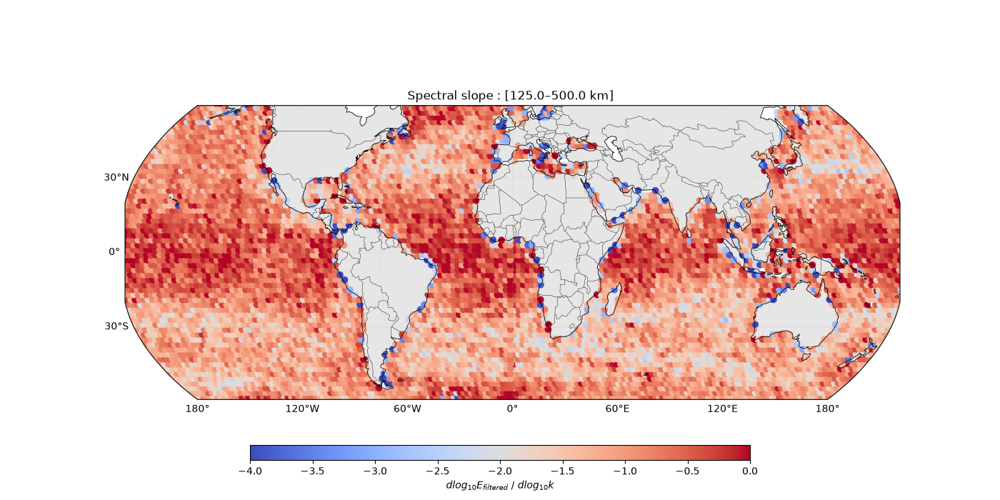

/tmp/ipykernel_323282/2506858527.py:8: RuntimeWarning: divide by zero encountered in log10
  k_vals = np.log10(ds_boxes_flagged["wavenumber"].values)          # (n_boxes, nk)
/tmp/ipykernel_323282/2506858527.py:9: RuntimeWarning: Mean of empty slice
  slope_mean = np.nanmean(np.diff(psd_vals[:,k_mask],axis=1)/np.diff(k_vals[k_mask]),axis=1)


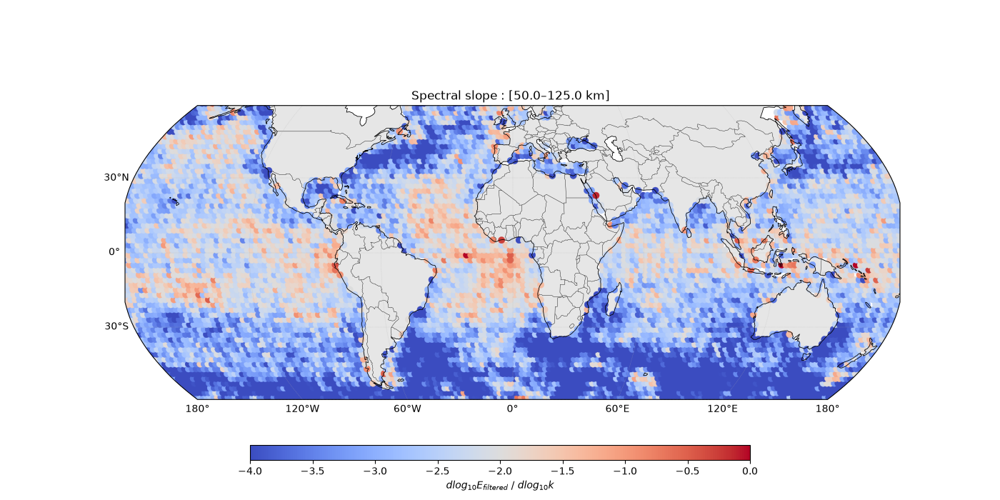

/tmp/ipykernel_323282/2506858527.py:8: RuntimeWarning: divide by zero encountered in log10
  k_vals = np.log10(ds_boxes_flagged["wavenumber"].values)          # (n_boxes, nk)
/tmp/ipykernel_323282/2506858527.py:9: RuntimeWarning: Mean of empty slice
  slope_mean = np.nanmean(np.diff(psd_vals[:,k_mask],axis=1)/np.diff(k_vals[k_mask]),axis=1)


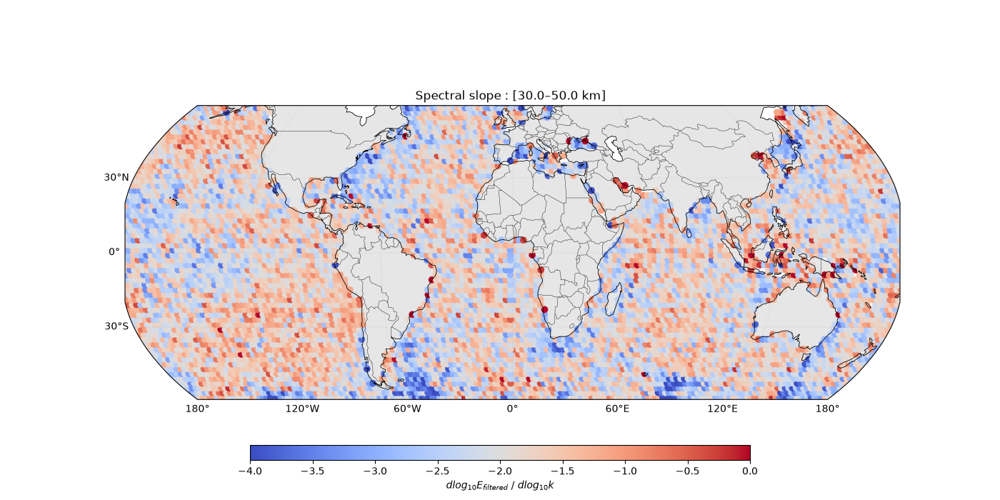

/tmp/ipykernel_323282/2506858527.py:8: RuntimeWarning: divide by zero encountered in log10
  k_vals = np.log10(ds_boxes_flagged["wavenumber"].values)          # (n_boxes, nk)
/tmp/ipykernel_323282/2506858527.py:9: RuntimeWarning: Mean of empty slice
  slope_mean = np.nanmean(np.diff(psd_vals[:,k_mask],axis=1)/np.diff(k_vals[k_mask]),axis=1)


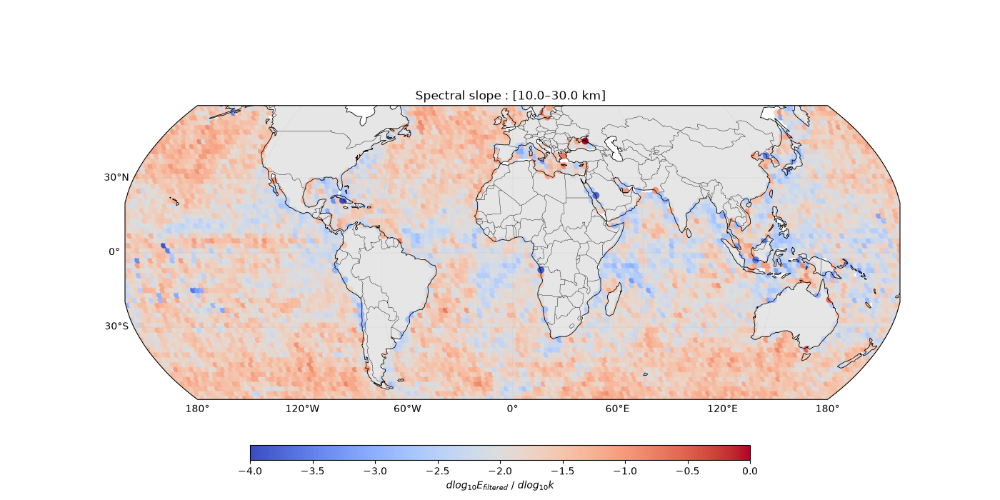

/tmp/ipykernel_323282/2506858527.py:8: RuntimeWarning: divide by zero encountered in log10
  k_vals = np.log10(ds_boxes_flagged["wavenumber"].values)          # (n_boxes, nk)
/tmp/ipykernel_323282/2506858527.py:9: RuntimeWarning: Mean of empty slice
  slope_mean = np.nanmean(np.diff(psd_vals[:,k_mask],axis=1)/np.diff(k_vals[k_mask]),axis=1)


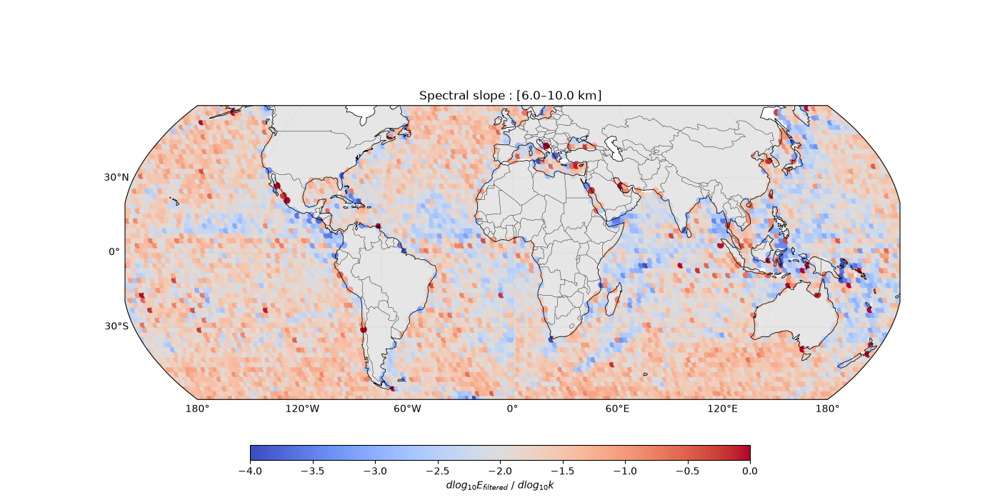

/tmp/ipykernel_323282/2506858527.py:8: RuntimeWarning: divide by zero encountered in log10
  k_vals = np.log10(ds_boxes_flagged["wavenumber"].values)          # (n_boxes, nk)
/tmp/ipykernel_323282/2506858527.py:9: RuntimeWarning: Mean of empty slice
  slope_mean = np.nanmean(np.diff(psd_vals[:,k_mask],axis=1)/np.diff(k_vals[k_mask]),axis=1)


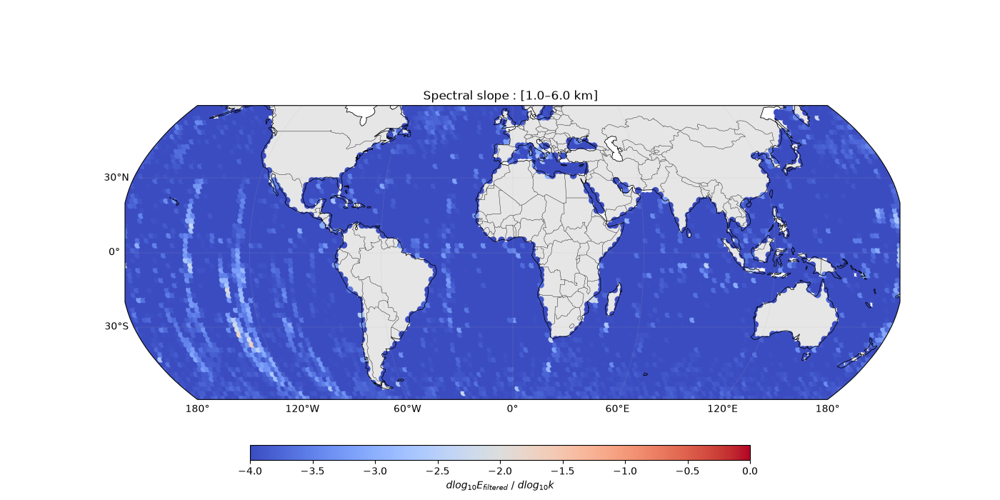

In [129]:
k_min,k_max = [1/SEGMENT_LENGTH_KM/2,1/125,1/50,1/30,1/10,1/6], [1/125,1/50,1/30,1/10,1/6,1] # /km
for K_MIN,K_MAX in zip(k_min,k_max):
    k = ds_boxes_flagged["wavenumber"].values
    k_mask = (k >= K_MIN) & (k <= K_MAX)
    dk = np.gradient(k)
    
    psd_vals = np.log10(ds_boxes_flagged["direct_mean_psd"].values)          # (n_boxes, nk)
    k_vals = np.log10(ds_boxes_flagged["wavenumber"].values)          # (n_boxes, nk)
    slope_mean = np.nanmean(np.diff(psd_vals[:,k_mask],axis=1)/np.diff(k_vals[k_mask]),axis=1)
    fig, ax = plot_box(slope_mean,ds_boxes_flagged["lon_center"].values,ds_boxes_flagged["lat_center"].values,
                       cmap="coolwarm",
                       label=r'$dlog_{10} E_{filtered}$ / $dlog_{10} k$',vmin=-4,vmax=0
                      #norm=mcolors.LogNorm(vmin=np.nanpercentile(energy, 5),
                      #                     vmax=np.nanpercentile(energy, 95))
    )
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
    ax.set_title(f"Spectral slope : [{1/K_MAX:.1f}–{1/K_MIN:.1f} km] ",y=1)
    plt.show()

### For future tests:


In [ ]:
N_TAPS = 17
k      = ds_segments.wavenumber.values
H      = hamming_transfer_function(k, dx_km = 0.25, n_taps=N_TAPS)
k_half = k[np.argmin(np.abs(H - 0.5))]

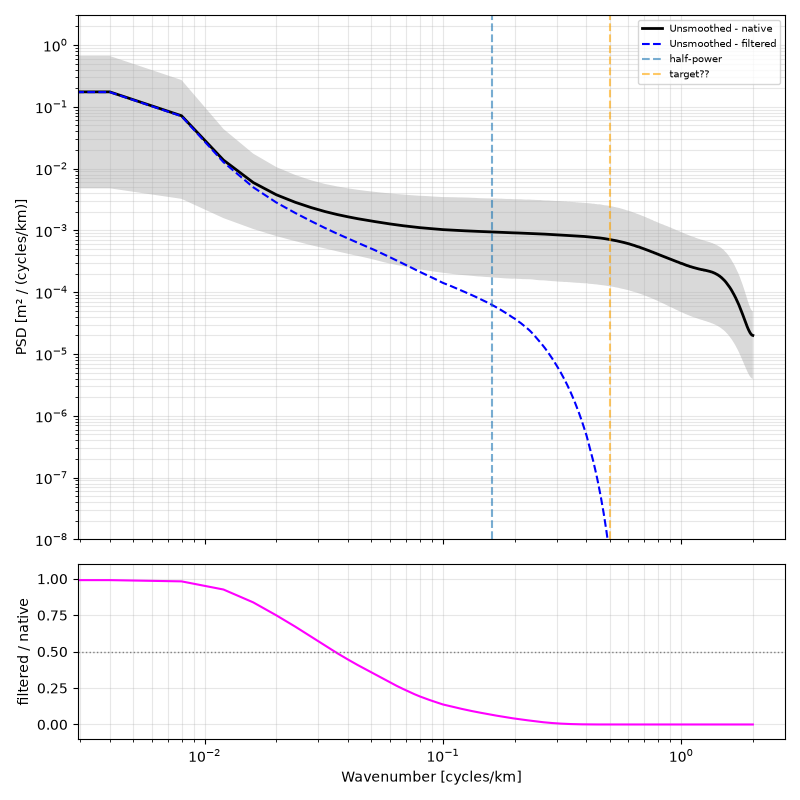

In [82]:
fig, axs = plt.subplots(2,1, figsize=(8, 8), sharex=True, gridspec_kw=dict(height_ratios=[3, 1]))

    
k = ds_flagged['wavenumber'].values
direct_stack = ds_flagged['direct_psd'].values
native_stack = ds_flagged['native_psd'].values

native_mean = np.nanmean(native_stack, axis=0)
direct_mean = np.nanmean(direct_stack, axis=0)
native_lo, native_hi = np.nanpercentile(native_stack, [5, 95], axis=0)

ax = axs[0]
ax.fill_between(k, native_lo, native_hi, color='k', alpha=0.15, lw=0)
ax.loglog(k, native_mean, c='k', lw=2, ls='-', label=f'Unsmoothed - native')
ax.loglog(k, direct_mean, c='b', lw=1.5, ls='--', label=f'Unsmoothed - filtered')
ax.axvline(k_half,ls='--',alpha = 0.6, label='half-power')
ax.axvline(1/2,ls='--',c = 'orange',alpha = 0.6, label='target??')


axs[1].semilogx(k, direct_mean / native_mean, c='magenta', lw=1.5)

axs[0].set_ylabel('PSD [m² / (cycles/km)]')
#axs[0].set_title(f'Patch-matched validation ({sum(len(v) for v in patch_match_results.values())} '
#                  f'matched patches, this file)')
axs[0].grid(True, which='both', alpha=0.3)
axs[0].legend(fontsize=7)
axs[0].set_ylim(1e-8,None)

axs[1].set_ylabel('filtered / native')
axs[1].axhline(0.5, c='0.5', ls=':', lw=1)
axs[1].set_xlabel('Wavenumber [cycles/km]')
axs[1].grid(True, which='both', alpha=0.3)
axs[1].set_ylim(-0.1,1.1)
fig.tight_layout()

In [101]:
n_taps = np.arange(1,19,2)
k_half = []
for N_TAPS in n_taps:
    k      = ds_segments.wavenumber.values
    H      = hamming_transfer_function(k, dx_km = 0.25, n_taps=N_TAPS)
    K_HALF = k[np.argmin(np.abs(H - 0.5))]
    k_half.append(K_HALF)

/tmp/ipykernel_323282/2308816364.py:3: RuntimeWarning: divide by zero encountered in scalar divide
  ax.scatter(n_taps[i], 1/kh, c='k')


Text(13.5, 1.4, 'cutoff = 1.67km')

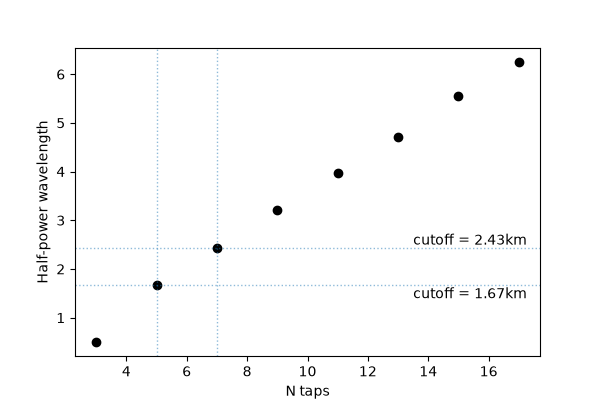

In [120]:
fig, ax = plt.subplots(figsize=(6,4))
for i,kh in enumerate(k_half):
    ax.scatter(n_taps[i], 1/kh, c='k')
ax.set_xlabel('N taps'); ax.set_ylabel('Half-power wavelength')
ax.axvline(7,lw=1.0,ls=':',alpha=0.5);
ax.axhline(1/k_half[3],lw=1.0,ls=':',alpha=0.5)
ax.text(13.5,2.5,f'cutoff = {np.around(1/k_half[3],decimals=2)}km')
ax.axvline(5,lw=1.0,ls=':',alpha=0.5);
ax.axhline(1/k_half[2],lw=1.0,ls=':',alpha=0.5)
ax.text(13.5,1.4,f'cutoff = {np.around(1/k_half[2],decimals=2)}km')

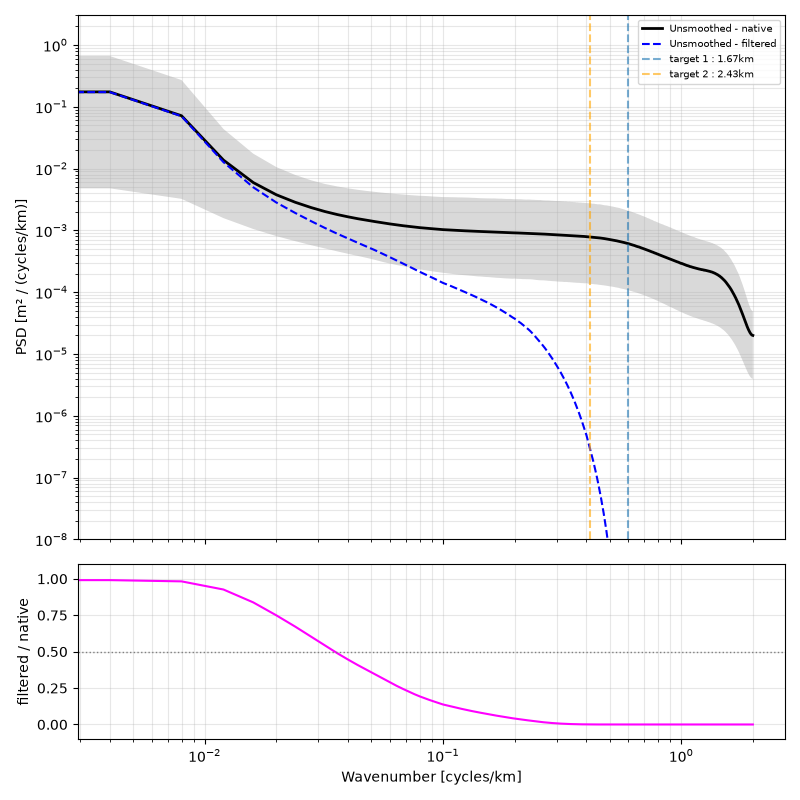

In [124]:
fig, axs = plt.subplots(2,1, figsize=(8, 8), sharex=True, gridspec_kw=dict(height_ratios=[3, 1]))

    
k = ds_flagged['wavenumber'].values
direct_stack = ds_flagged['direct_psd'].values
native_stack = ds_flagged['native_psd'].values

native_mean = np.nanmean(native_stack, axis=0)
direct_mean = np.nanmean(direct_stack, axis=0)
native_lo, native_hi = np.nanpercentile(native_stack, [5, 95], axis=0)

ax = axs[0]
ax.fill_between(k, native_lo, native_hi, color='k', alpha=0.15, lw=0)
ax.loglog(k, native_mean, c='k', lw=2, ls='-', label=f'Unsmoothed - native')
ax.loglog(k, direct_mean, c='b', lw=1.5, ls='--', label=f'Unsmoothed - filtered')
ax.axvline(k_half[2],ls='--',alpha = 0.6, label=f'target 1 : {np.around(1/k_half[2],decimals=2)}km')
ax.axvline(k_half[3],ls='--',c = 'orange',alpha = 0.6, label=f'target 2 : {np.around(1/k_half[3],decimals=2)}km')


axs[1].semilogx(k, direct_mean / native_mean, c='magenta', lw=1.5)

axs[0].set_ylabel('PSD [m² / (cycles/km)]')
#axs[0].set_title(f'Patch-matched validation ({sum(len(v) for v in patch_match_results.values())} '
#                  f'matched patches, this file)')
axs[0].grid(True, which='both', alpha=0.3)
axs[0].legend(fontsize=7)
axs[0].set_ylim(1e-8,None)

axs[1].set_ylabel('filtered / native')
axs[1].axhline(0.5, c='0.5', ls=':', lw=1)
axs[1].set_xlabel('Wavenumber [cycles/km]')
axs[1].grid(True, which='both', alpha=0.3)
axs[1].set_ylim(-0.1,1.1)
fig.tight_layout()